<a href="https://colab.research.google.com/github/chirag2saraiya/TSAI-DeepVision-EVA4/blob/master/05-Human-Pose-Estimation/S5_Human_Pose_Estimation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Human Pose Estimation

In [1]:
# clone the human-pose-estimation.pytorch repo
!git clone https://github.com/microsoft/human-pose-estimation.pytorch.git

Cloning into 'human-pose-estimation.pytorch'...
remote: Enumerating objects: 188, done.
remote: Total 188 (delta 0), reused 0 (delta 0), pack-reused 188
Receiving objects: 100% (188/188), 68.78 KiB | 4.91 MiB/s, done.
Resolving deltas: 100% (86/86), done.


In [2]:
# Copy only the required files
!cp human-pose-estimation.pytorch/lib/core/config.py .
!cp human-pose-estimation.pytorch/lib/models/pose_resnet.py .
!cp human-pose-estimation.pytorch/experiments/mpii/resnet50/256x256_d256x3_adam_lr1e-3.yaml .
 

In [3]:
import torch
import torchvision
from torchvision import transforms

from PIL import Image,ImageDraw
import matplotlib.pyplot as plt

import numpy as np
from google.colab.patches import cv2_imshow

import cv2


In [4]:
from config import config
from config import update_config


In [5]:
# Update configuration as required
update_config('256x256_d256x3_adam_lr1e-3.yaml')

In [6]:
import pose_resnet
model = pose_resnet.get_pose_net(config, is_train=False)

In [7]:
from torchsummary import summary
summary(model,(3,256,256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           9,408
       BatchNorm2d-2         [-1, 64, 128, 128]             128
              ReLU-3         [-1, 64, 128, 128]               0
         MaxPool2d-4           [-1, 64, 64, 64]               0
            Conv2d-5           [-1, 64, 64, 64]           4,096
       BatchNorm2d-6           [-1, 64, 64, 64]             128
              ReLU-7           [-1, 64, 64, 64]               0
            Conv2d-8           [-1, 64, 64, 64]          36,864
       BatchNorm2d-9           [-1, 64, 64, 64]             128
             ReLU-10           [-1, 64, 64, 64]               0
           Conv2d-11          [-1, 256, 64, 64]          16,384
      BatchNorm2d-12          [-1, 256, 64, 64]             512
           Conv2d-13          [-1, 256, 64, 64]          16,384
      BatchNorm2d-14          [-1, 256,

In [8]:
# Download model trained on mpii dataset with resnet 50 base
!gdown https://drive.google.com/uc?id=1V2AaVpDSn-eS7jrFScHLJ-wvTFuQ0-Dc

Downloading...
From: https://drive.google.com/uc?id=1V2AaVpDSn-eS7jrFScHLJ-wvTFuQ0-Dc
To: /content/pose_resnet_50_256x256.pth.tar
136MB [00:01, 99.6MB/s]


In [9]:
model.load_state_dict(torch.load('pose_resnet_50_256x256.pth.tar',map_location=torch.device('cpu')))

<All keys matched successfully>

In [10]:
!wget http://bp.funrahi.com/2013/08/kidzania-launch-shahrukh-khan/kidzania-launch-shahrukh-khan-61755.jpg -O shahrukh.jpg

--2020-09-12 16:12:49--  http://bp.funrahi.com/2013/08/kidzania-launch-shahrukh-khan/kidzania-launch-shahrukh-khan-61755.jpg
Resolving bp.funrahi.com (bp.funrahi.com)... 172.67.179.45, 104.28.3.180, 104.28.2.180, ...
Connecting to bp.funrahi.com (bp.funrahi.com)|172.67.179.45|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://bp.funrahi.com/file/frcontent/2013/08/kidzania-launch-shahrukh-khan/kidzania-launch-shahrukh-khan-61755.jpg [following]
--2020-09-12 16:12:49--  https://bp.funrahi.com/file/frcontent/2013/08/kidzania-launch-shahrukh-khan/kidzania-launch-shahrukh-khan-61755.jpg
Connecting to bp.funrahi.com (bp.funrahi.com)|172.67.179.45|:443... connected.
HTTP request sent, awaiting response... 200 
Length: 833192 (814K) [image/jpeg]
Saving to: ‘shahrukh.jpg’

shahrukh.jpg        100%[===================>] 813.66K  1.68MB/s    in 0.5s    

2020-09-12 16:12:51 (1.68 MB/s) - ‘shahrukh.jpg’ saved [833192/833192]



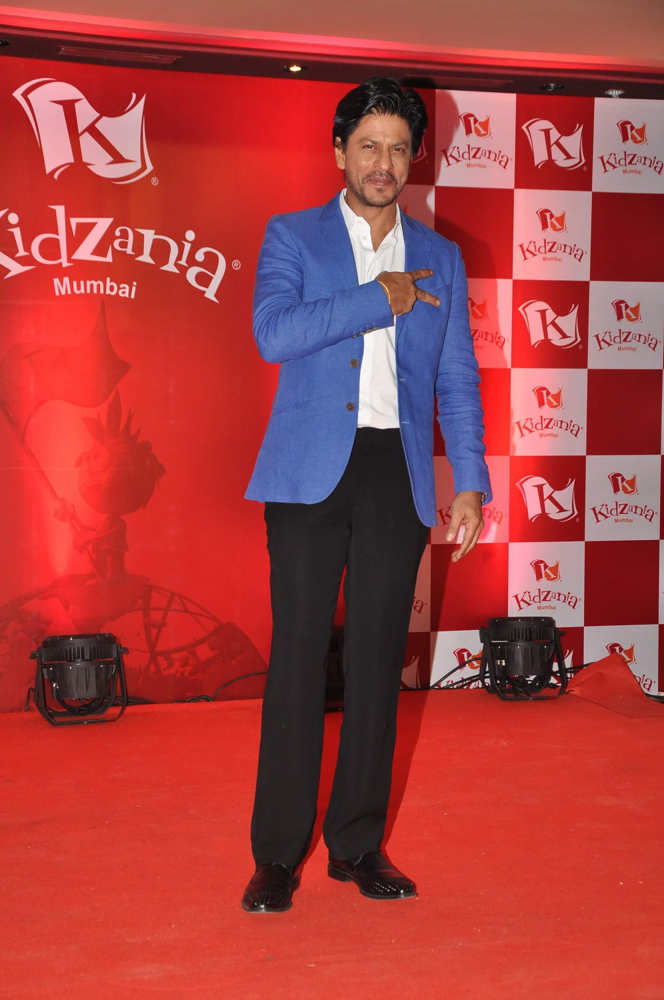

In [11]:
# Open image as PIL instance
in_img = Image.open('shahrukh.jpg')
in_img

In [12]:
# Define image_transform. Model is expecting 256x256 tensor as image
image_transform = transforms.Compose([
                              transforms.Resize((256,256)),
                              transforms.ToTensor(),
                              transforms.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225])])

In [13]:
# Get predictions by by paasing image to model through image_transform
model.eval()  # indicate Model evaluation mode
predictions = model(image_transform(in_img).unsqueeze(0))
# Reduce extra 0th dimension
predictions = predictions.squeeze(0)

In [14]:
# get a numpy copy of the prediction tensor
import copy
predictions = copy.deepcopy(predictions.cpu().detach().numpy())

In [ ]:
print(predictions)

In [16]:
# Get number of joints, predicted height and widths
num_joints,pred_height,pred_width = predictions.shape

In [17]:
# Define joint names
joint_dict = {0:"r_ankle",1:"r_knee", 2: "r_hip",
              3: "l_hip", 4:"l_knee", 5: "l ankle",
              6: "pelvis",7: "thorax",8: "upper_neck",
              9: "head_top",10: "r_wrist", 11:"r_elbow", 
              12: "r_shoulder", 13:"l_shoulder", 
              14:"l_elbow", 15: "l_wrist"}

In [18]:
# Define joint pairs. This will be used later for plotting the pose over image
joint_pairs = [
# TORSO
              [9, 8],   # head_top <-> upper_neck
              [8, 7],   # upper_neck <-> thorax
              [7, 6],   # thorax <-> pelvis
# RIGHT ARM  
              [7, 12],  # thorax <-> r_shoulder
              [12, 11], # r_shoulder <-> r_elbow
              [11, 10], # r_elbow <-> r_wrist
# LEFT ARM
              [7, 13],  # thorax <-> l_shoulder
              [13, 14], # l_shoulder <-> l_elbow
              [14, 15], # l_elbow <-> l_wrist             
# RIGHT LEG
              [6, 2], # pelvis <-> r_hip
              [2, 1], # r_hip <-> r_knee
              [1, 0], # r_knee <-> r_ankle
# LEFT LEG
              [6, 3], # pelvis <-> l_hip
              [3, 4], # l_hip <-> l_knee
              [4, 5] # l_knee <-> l_ankle
]

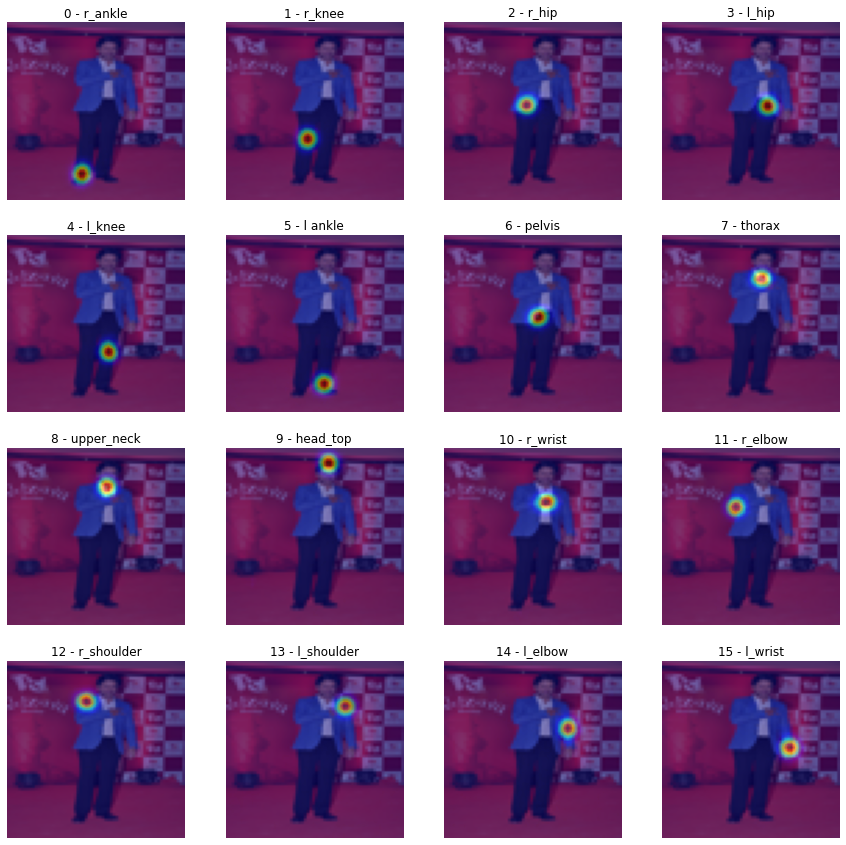

In [19]:
# Plot joint heatmaps over the input image
plt.figure(figsize=(15, 15))
for i in range(num_joints):
    plt.subplot(4, 4, i + 1)
    plt.title(f'{i} - {joint_dict[i]}')
    plt.imshow(in_img.resize((pred_width, pred_height)))
    plt.imshow(predictions[i], alpha=0.5, cmap='jet')
    plt.axis('off')
plt.show()
  

In [20]:
# Find keypoint coordinates
joint_coords = [cv2.minMaxLoc(x)[3] for x in predictions]

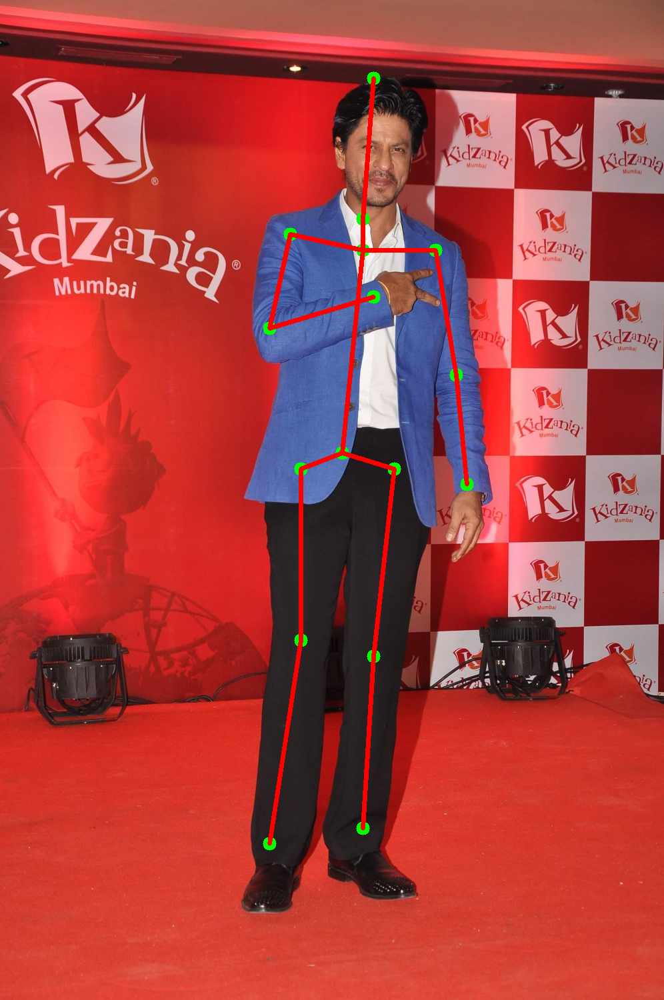

In [21]:
# Create stick figure
stick_img = cv2.imread('shahrukh.jpg')
img_height,img_width, _ = stick_img.shape

# Scale joint keypoints according to input image size
new_joint_coords = [(j[0]*img_width//pred_width,j[1]*img_height//pred_height) for j in joint_coords]

# Plot circles at points corresponding to the keypoints
for joint in new_joint_coords:
  stick_img = cv2.circle(stick_img,joint,radius=10,color=(0,255,0),thickness = -1)

# Draw lines connecting the joint pairs
for pair in joint_pairs:
  stick_img = cv2.line(stick_img, new_joint_coords[pair[0]], new_joint_coords[pair[1]], color = (0,0,255), thickness = 5) 

cv2_imshow(stick_img)

In [22]:
torch.save(model.state_dict(), "model_save.pt")

In [23]:
import os

In [24]:
print('Size (MB):', os.path.getsize("model_save.pt")/1e6)

Size (MB): 136.326647


### ONNX Deployment


In [25]:
!pip install onnx onnxruntime

     |████████████████████████████████| 7.4MB 4.4MB/s 
     |████████████████████████████████| 4.4MB 42.6MB/s 


In [26]:
import io
import numpy as np
import torch.onnx

# Input to the model
torch_model = model
batch_size = 1
x = torch.randn(batch_size, 3, 256, 256, requires_grad=True)
torch_out = torch_model(x)

# Export the model
torch.onnx.export(torch_model,               # model being run
                  x,                         # model input (or a tuple for multiple inputs)
                  "simple_pose_estimation.onnx",   # where to save the model (can be a file or file-like object)
                  export_params=True,        # store the trained parameter weights inside the model file
                  opset_version=10,          # the ONNX version to export the model to
                  do_constant_folding=True,  # whether to execute constant folding for optimization
                  input_names = ['input'],   # the model's input names
                  output_names = ['output'], # the model's output names
                  dynamic_axes={'input' : {0 : 'batch_size'},    # variable lenght axes
                                'output' : {0 : 'batch_size'}})

import onnx

onnx_model = onnx.load("simple_pose_estimation.onnx")
onnx.checker.check_model(onnx_model)


In [27]:
import onnxruntime

ort_session = onnxruntime.InferenceSession("simple_pose_estimation.onnx")

def to_numpy(tensor):
    return tensor.detach().cpu().numpy() if tensor.requires_grad else tensor.cpu().numpy()

# compute ONNX Runtime output prediction
ort_inputs = {ort_session.get_inputs()[0].name: to_numpy(x)}
ort_outs = ort_session.run(None, ort_inputs)

# compare ONNX Runtime and PyTorch results
np.testing.assert_allclose(to_numpy(torch_out), ort_outs[0], rtol=1e-03, atol=1e-05)

print("Exported model has been tested with ONNXRuntime, and the result looks good!")

Exported model has been tested with ONNXRuntime, and the result looks good!


In [28]:
tr_img = image_transform(in_img)

In [29]:
import onnxruntime

ort_session = onnxruntime.InferenceSession("simple_pose_estimation.onnx")

def to_numpy(tensor):
    return tensor.detach().cpu().numpy() if tensor.requires_grad else tensor.cpu().numpy()

# compute ONNX Runtime output prediction
ort_inputs = {ort_session.get_inputs()[0].name: to_numpy(tr_img.unsqueeze(0))}
ort_outs = ort_session.run(None, ort_inputs)
ort_outs = np.array(ort_outs[0][0])

In [31]:
# Get number of joints, predicted height and widths
num_joints,pred_height,pred_width = ort_outs.shape

In [32]:
print(num_joints)
print(pred_height)
print(pred_width)

16
64
64


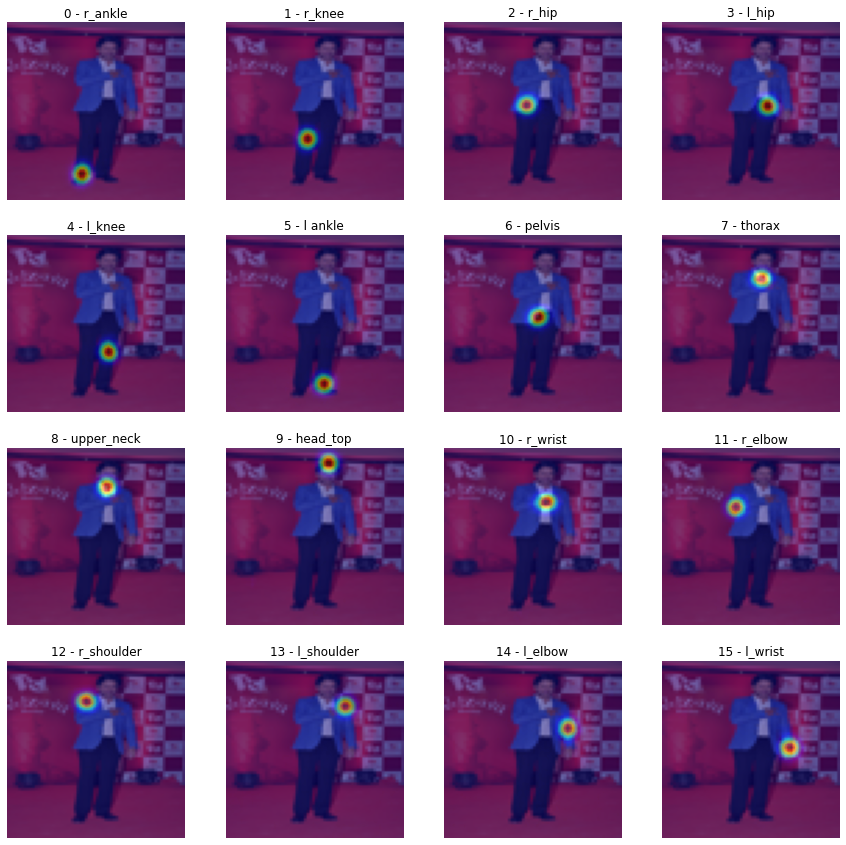

In [33]:
# Plot joint heatmaps over the input image
plt.figure(figsize=(15, 15))
for i in range(num_joints):
    plt.subplot(4, 4, i + 1)
    plt.title(f'{i} - {joint_dict[i]}')
    plt.imshow(in_img.resize((pred_width, pred_height)))
    plt.imshow(ort_outs[i], alpha=0.5, cmap='jet')
    plt.axis('off')
plt.show()
  

In [34]:
# Find keypoint coordinates
joint_coords = [cv2.minMaxLoc(x)[3] for x in ort_outs]

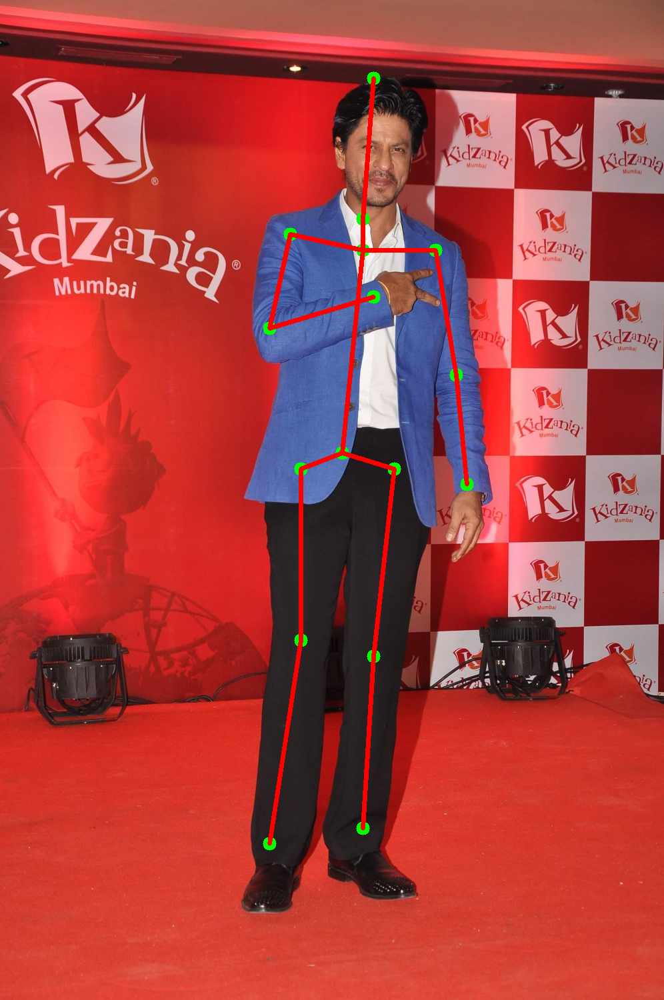

In [35]:
# Create stick figure
stick_img = cv2.imread('shahrukh.jpg')
img_height,img_width, _ = stick_img.shape

# Scale joint keypoints according to input image size
new_joint_coords = [(j[0]*img_width//pred_width,j[1]*img_height//pred_height) for j in joint_coords]

# Plot circles at points corresponding to the keypoints
for joint in new_joint_coords:
  stick_img = cv2.circle(stick_img,joint,radius=10,color=(0,255,0),thickness = -1)

# Draw lines connecting the joint pairs
for pair in joint_pairs:
  stick_img = cv2.line(stick_img, new_joint_coords[pair[0]], new_joint_coords[pair[1]], color = (0,0,255), thickness = 5) 

cv2_imshow(stick_img)

### ONNX deployment without torchvision
We will try and replace components from torchvision with simple numpy operations so that while deploying model to AWS lambda we need not include torchvision

In [70]:
# Open image as PIL instance
in_img = Image.open('shahrukh.jpg')


Resize..................


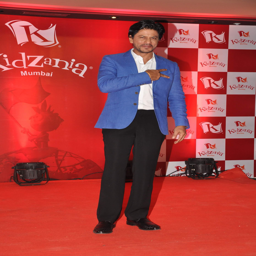

In [71]:
newsize = (256, 256) 
    
print("Resize..................")
in_img_resized = in_img.resize(newsize)
in_img_resized

In [72]:
print("Image Copy..................")
img_copy = in_img_resized.copy()
image = np.array(img_copy, dtype=np.float32)/255.0
print(np.min(image),np.max(image))

Image Copy..................
0.015686275 1.0


In [73]:
def normalizeImageChannel(x):
    x[:,:,0] = (x[:,:,0] - 0.485) / 0.229
    x[:,:,1] = (x[:,:,1] - 0.456) / 0.224
    x[:,:,2] = (x[:,:,2] - 0.406) / 0.225

    return x


In [74]:
print("Normalise..................")

image = normalizeImageChannel(image)
print(image.shape)
print(np.min(image),np.max(image))

Normalise..................
(256, 256, 3)
-1.9656862 2.5877128


In [75]:
image = np.transpose(image,(2,0,1))
print(image.shape)
image=np.expand_dims(image, axis=0)
print(image.shape)    

(3, 256, 256)
(1, 3, 256, 256)


In [76]:
import onnxruntime

ort_session = onnxruntime.InferenceSession("simple_pose_estimation.onnx")

def to_numpy(tensor):
    return tensor.detach().cpu().numpy() if tensor.requires_grad else tensor.cpu().numpy()

# compute ONNX Runtime output prediction
ort_inputs = {ort_session.get_inputs()[0].name: image}
#ort_inputs = {ort_session.get_inputs()[0].name: to_numpy(tr_img.unsqueeze(0))}
ort_outs = ort_session.run(None, ort_inputs)
ort_outs = np.array(ort_outs[0][0])

In [77]:
# Get number of joints, predicted height and widths
num_joints,pred_height,pred_width = ort_outs.shape

In [78]:
print(num_joints)
print(pred_height)
print(pred_width)

16
64
64


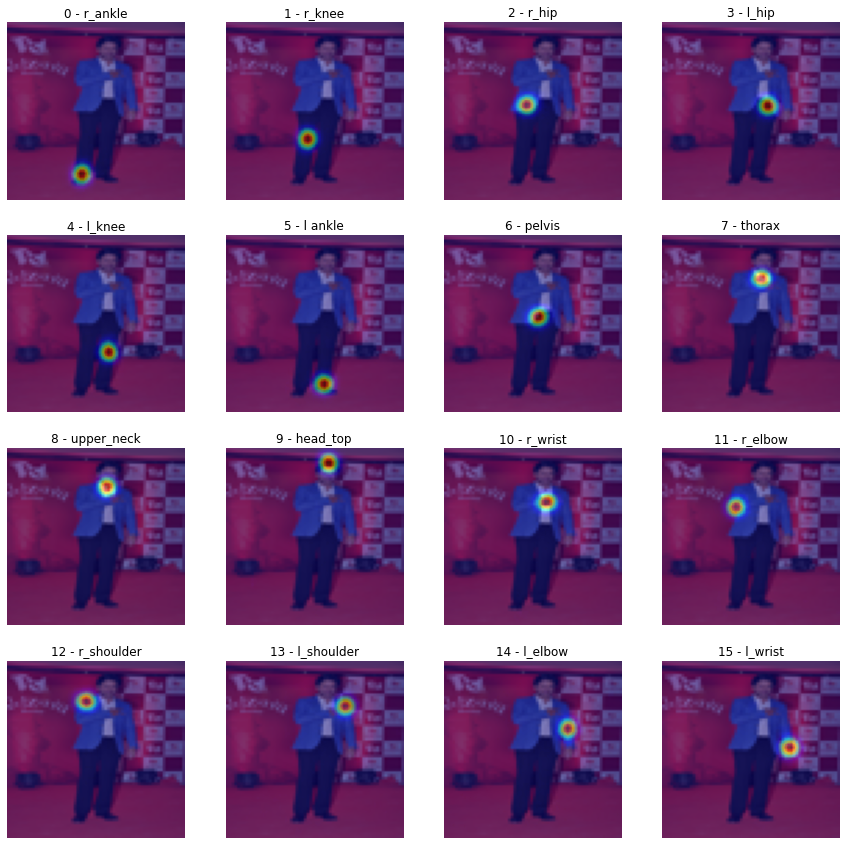

In [79]:
# Plot joint heatmaps over the input image
plt.figure(figsize=(15, 15))
for i in range(num_joints):
    plt.subplot(4, 4, i + 1)
    plt.title(f'{i} - {joint_dict[i]}')
    plt.imshow(in_img.resize((pred_width, pred_height)))
    plt.imshow(ort_outs[i], alpha=0.5, cmap='jet')
    plt.axis('off')
plt.show()
  

In [80]:
# Find keypoint coordinates
joint_coords = [cv2.minMaxLoc(x)[3] for x in ort_outs]

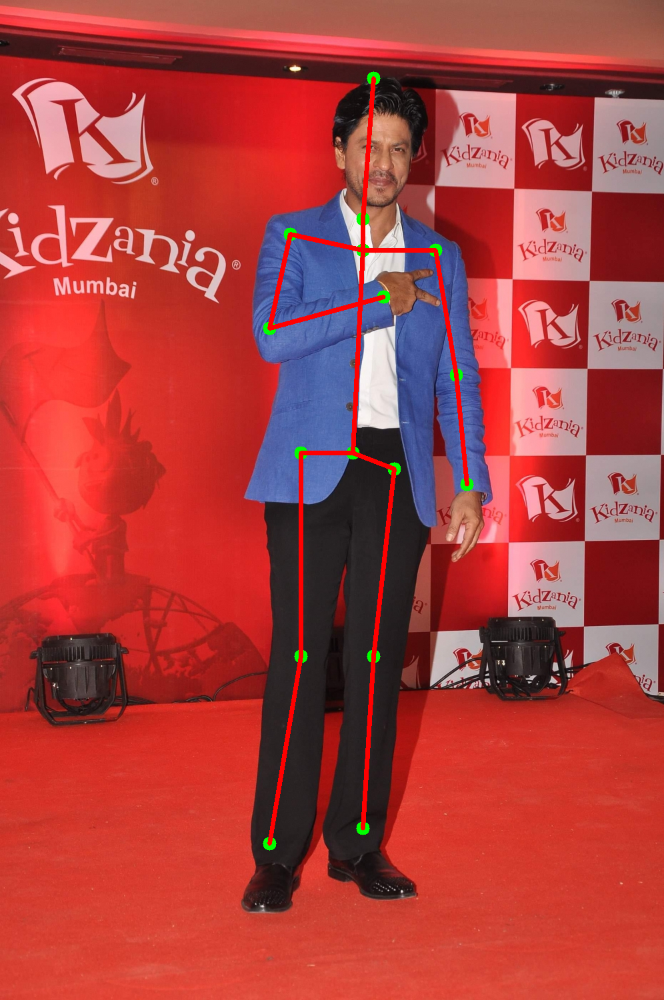

In [81]:
# Create stick figure
stick_img = cv2.imread('shahrukh.jpg')
img_height,img_width, _ = stick_img.shape

# Scale joint keypoints according to input image size
new_joint_coords = [(j[0]*img_width//pred_width,j[1]*img_height//pred_height) for j in joint_coords]

# Plot circles at points corresponding to the keypoints
for joint in new_joint_coords:
  stick_img = cv2.circle(stick_img,joint,radius=10,color=(0,255,0),thickness = -1)

# Draw lines connecting the joint pairs
for pair in joint_pairs:
  stick_img = cv2.line(stick_img, new_joint_coords[pair[0]], new_joint_coords[pair[1]], color = (0,0,255), thickness = 5) 

cv2_imshow(stick_img)